# Data Mining- Homework 1
## Submitted by -
### Md Asifur Rahman; 

In [2]:
import pandas as pd
import os
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.patches as mpatches
from utils import *

In [3]:
file_path = '../data/training.csv'
data = pd.read_csv(file_path)

#  (A) Checking for missing values and duplicated rows in training.csv

In [4]:
check_datasets(file_path, file_count=1)

No Missing value found
No duplicated row found


In [5]:
data.insert(0,'ID', list(range(0,data.shape[0])))
data.set_index('ID', inplace=True)
data.head()

,activity_id,category_id,athlete_id,filename,timestamp,distance,elapsed_time,moving_time,avg_speed,max_speed,elevation_gain,elevation_loss,avg_hr,max_hr,calories,avg_cadence,max_cadence,avg_power
ID,,,,,,,,,,,,,,,,,,
0,1,0,1,data/dataset1/1_tcx/1005.tcx,2016-09-03T08:02:35.000Z,14.75,40.75,40.50,24.44,64.46,244,248,120,173,336,79,143,154
1,2,0,1,data/dataset1/1_tcx/1013.tcx,2016-05-07T07:53:44.000Z,94.92,285.13,284.60,26.56,71.65,1458,1444,132,190,2195,82,143,170
2,3,0,1,data/dataset1/1_tcx/1021.tcx,2014-07-04T18:03:33.000Z,16.99,29.27,29.25,35.94,67.40,153,237,132,182,259,94,133,150
3,4,0,1,data/dataset1/1_tcx/1025.tcx,2017-08-08T15:39:58.000Z,46.92,165.68,165.53,17.78,69.26,1446,1449,128,183,1965,78,151,216
4,5,0,1,data/dataset1/1_tcx/1037.tcx,2017-03-30T14:33:57.000Z,23.99,74.35,74.35,26.55,68.02,472,500,123,180,558,78,121,171


# (B) Data Analysis and Visualization

In [6]:
data.shape

(1937, 18)

In [7]:
data['athlete_id'].value_counts()

4    523
1    466
2    385
5    314
6    135
3    114
Name: athlete_id, dtype: int64

In [8]:
data['category_id'].value_counts()

0    1623
2     234
4      54
1      14
3      12
Name: category_id, dtype: int64

## According to the intern's report
####  category_id
       
  * 0:      Uncategorized (1623)
  * 1:      indoor training (14)
  * 2:      Outdoor training (234)
  * 3:      Races (12)
  * 4:      Virtual rides (54)
  
#### athlete_id
   * 1:      Professional
   * 2:      Professional
   * 3:      Professional
   * 4:      Professional
   * 5:      Amateur (Author)
   * 6:      Unknown


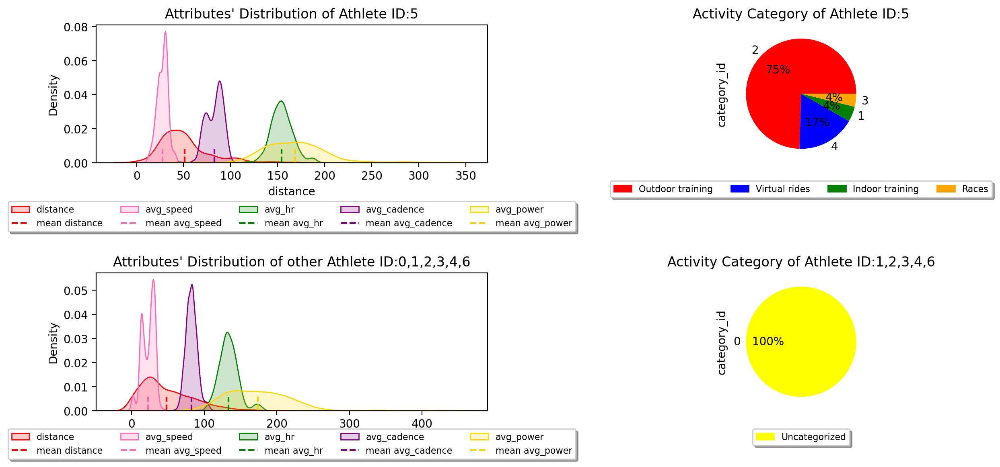

In [9]:
df_5 = data[(data['athlete_id']==5)]
df_others = data[(data['athlete_id']!=5)]
plt.figure(figsize = (15, 10), dpi=200)

yellow_patch = mpatches.Patch(color='yellow', label='Uncategorized')
green_patch = mpatches.Patch(color='green', label='Indoor training')
red_patch = mpatches.Patch(color='red', label='Outdoor training')
orange_patch = mpatches.Patch(color='orange', label='Races')
blue_patch = mpatches.Patch(color='blue', label='Virtual rides')
path_list=[yellow_patch, green_patch, red_patch, orange_patch, blue_patch]
colors = ["yellow","green","red","orange","blue"]
#------------------------------------------------------
plt.subplot(2,2,1)
ax=sns.kdeplot(df_5['distance'], color='red', fill=True, alpha=.2, linewidth=1, label="distance")
ax.axvline(df_5['distance'].mean(), color='red', linestyle="--", ymax=0.10, label="mean distance")

ax = sns.kdeplot(df_5['avg_speed'], color='hotpink', fill=True, alpha=.2, linewidth=1, label="avg_speed")
ax.axvline(df_5['avg_speed'].mean(), color='hotpink', linestyle="--", ymax=0.10, label="mean avg_speed")

ax = sns.kdeplot(df_5['avg_hr'], color='green', fill=True, alpha=.2, linewidth=1, label="avg_hr")
ax.axvline(df_5['avg_hr'].mean(), color='green', linestyle="--", ymax=0.10, label="mean avg_hr")

ax = sns.kdeplot(df_5['avg_cadence'], color='purple', fill=True, alpha=.2, linewidth=1, label="avg_cadence")
ax.axvline(df_5['avg_cadence'].mean(), color='purple', linestyle="--", ymax=0.10, label="mean avg_cadence")

ax = sns.kdeplot(df_5['avg_power'], color='gold', fill=True, alpha=.2, linewidth=1, label="avg_power")
ax.axvline(df_5['avg_power'].mean(), color='gold', linestyle="--", ymax=0.10, label="mean avg_power")
plt.title("Attributes' Distribution of Athlete ID:5")
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), fontsize=8, fancybox=True, shadow=True, ncol=5)
#------------------------------------------------------
plt.subplot(2,2,2)

label_val = df_5['category_id'].value_counts()
legend_patch_df5 = []
pi_color_df5=[]
for v in label_val.index:
      legend_patch_df5.append(path_list[v])
      pi_color_df5.append(colors[v])

ax = df_5['category_id'].value_counts().plot(kind='pie',  figsize=(14,6),autopct='%.0f%%', colors=pi_color_df5)
ax.legend(handles=legend_patch_df5, loc='upper center', bbox_to_anchor=(0.5, -0.1), fontsize=8, fancybox=True, shadow=True, ncol=5)
plt.title("Activity Category of Athlete ID:5")
#------------------------------------------------------
plt.subplot(2,2,3)
ax=sns.kdeplot(df_others['distance'], color='red', fill=True, alpha=.2, linewidth=1, label="distance")
ax.axvline(df_others['distance'].mean(), color='red', linestyle="--", ymax=0.10, label="mean distance")

ax = sns.kdeplot(df_others['avg_speed'], color='hotpink', fill=True, alpha=.2, linewidth=1, label="avg_speed")
ax.axvline(df_others['avg_speed'].mean(), color='hotpink', linestyle="--", ymax=0.10, label="mean avg_speed")

ax = sns.kdeplot(df_others['avg_hr'], color='green', fill=True, alpha=.2, linewidth=1, label="avg_hr")
ax.axvline(df_others['avg_hr'].mean(), color='green', linestyle="--", ymax=0.10, label="mean avg_hr")

ax = sns.kdeplot(df_others['avg_cadence'], color='purple', fill=True, alpha=.2, linewidth=1, label="avg_cadence")
ax.axvline(df_others['avg_cadence'].mean(), color='purple', linestyle="--", ymax=0.10, label="mean avg_cadence")

ax = sns.kdeplot(df_others['avg_power'], color='gold', fill=True, alpha=.2, linewidth=1, label="avg_power")
ax.axvline(df_others['avg_power'].mean(), color='gold', linestyle="--", ymax=0.10, label="mean avg_power")

plt.title("Attributes' Distribution of other Athlete ID:0,1,2,3,4,6")
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fontsize=8, fancybox=True, shadow=True, ncol=5)
#------------------------------------------------------
plt.subplot(2,2,4)
label_val = df_others['category_id'].value_counts()
legend_patch_others = []
pi_color_others=[]
for v in label_val.index:
  legend_patch_others.append(path_list[v])
  pi_color_others.append(colors[v])
ax = df_others['category_id'].value_counts().plot(kind='pie',  figsize=(14,6),autopct='%.0f%%', colors=pi_color_others)
ax.legend(handles=legend_patch_others, loc='upper center', bbox_to_anchor=(0.5, -0.1), fontsize=8, fancybox=True, shadow=True, ncol=5)
plt.title("Activity Category of Athlete ID:1,2,3,4,6")

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.8)
plt.show()

### Analysis 1:
We can see from the distirbution plots that the attributes' distribution for the athletes with athlete_id:1,2,3,4,6 are quite different from the distribution of the attributes of the author (athlete_id: 5). 

In [10]:
result = data.groupby('category_id')['athlete_id'].value_counts()
print(result)

category_id  athlete_id
0            4             523
             1             466
             2             385
             6             135
             3             114
1            5              14
2            5             234
3            5              12
4            5              54
Name: athlete_id, dtype: int64


### Analysis 2:
The number of data instances according to the tier of athletes and activity category is  not balanced. The athletes with athlete_id:1,2,3,4,6 performed activities from only one category i.e. uncategorized (category_id:0). Whereas, the author's (athlete_ID:5) activities includes outdoor training, virtual rides, indoor training and races.

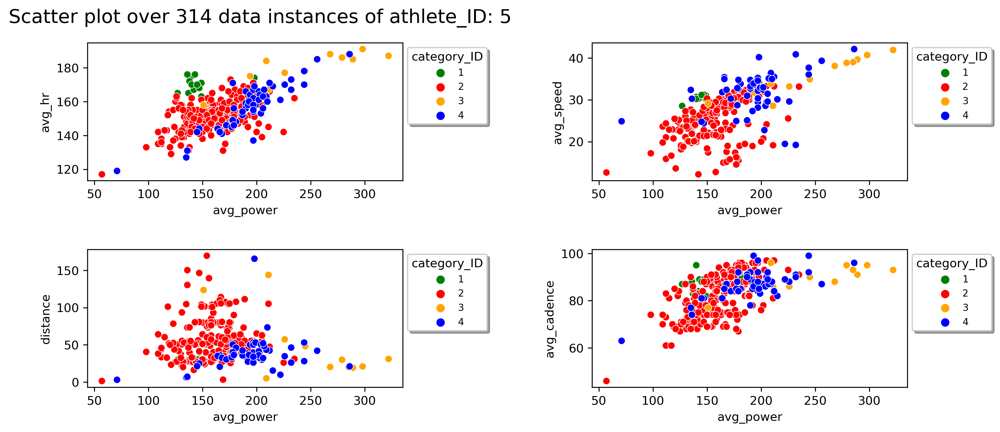

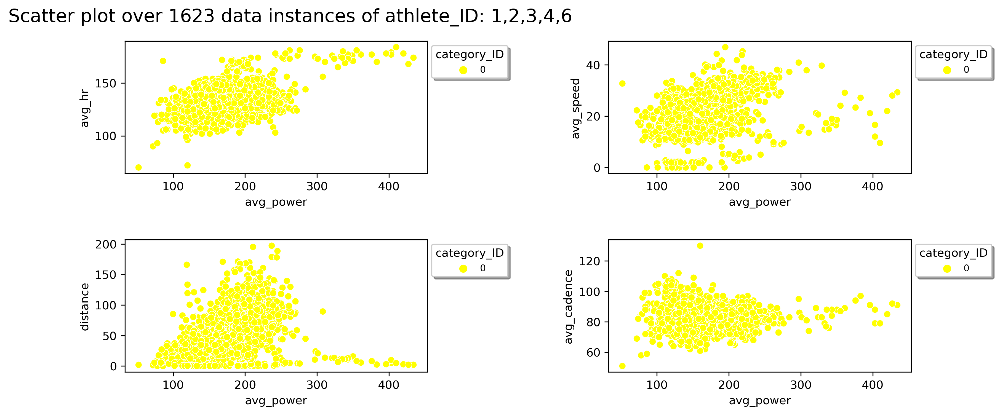

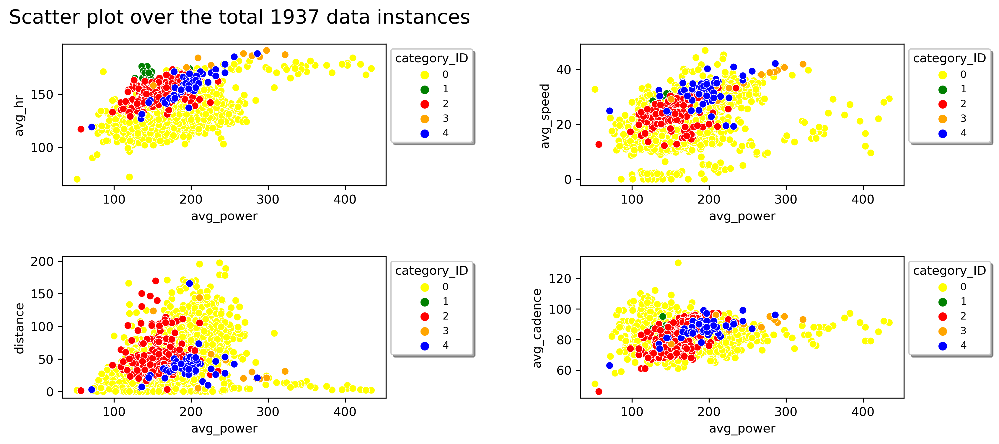

In [11]:
fig = plt.figure(figsize=(5,5),dpi=300)
plt.subplot(2,2,1)
ax =sns.scatterplot(x='avg_power',y='avg_hr',hue='category_id',palette=["green","red","orange","blue"],data=df_5)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,2)
ax =sns.scatterplot(x='avg_power',y='avg_speed',hue='category_id',palette=["green","red","orange","blue"],data=df_5)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,3)
ax =sns.scatterplot(x='avg_power',y='distance',hue='category_id',palette=["green","red","orange","blue"],data=df_5)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,4)
ax =sns.scatterplot(x='avg_power',y='avg_cadence',hue='category_id',palette=["green","red","orange","blue"],data=df_5)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=2, 
                    top=0.9, 
                    wspace=0.6, 
                    hspace=0.5)
fig.suptitle('Scatter plot over 314 data instances of athlete_ID: 5', fontsize=16)
plt.show()

fig =plt.figure(figsize=(5,5),dpi=300)
plt.subplot(2,2,1)
ax =sns.scatterplot(x='avg_power',y='avg_hr',hue='category_id',palette=["yellow"],data=df_others)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,2)
ax =sns.scatterplot(x='avg_power',y='avg_speed',hue='category_id',palette=["yellow"],data=df_others)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,3)
ax =sns.scatterplot(x='avg_power',y='distance',hue='category_id',palette=["yellow"],data=df_others)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,4)
ax =sns.scatterplot(x='avg_power',y='avg_cadence',hue='category_id',palette=["yellow"],data=df_others)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=2, 
                    top=0.9, 
                    wspace=0.6, 
                    hspace=0.5)
fig.suptitle('Scatter plot over 1623 data instances of athlete_ID: 1,2,3,4,6', ha='center', fontsize=16)

fig =plt.figure(figsize=(5,5),dpi=300)
plt.subplot(2,2,1)
ax =sns.scatterplot(x='avg_power',y='avg_hr',hue='category_id',palette=["yellow","green","red","orange","blue"],data=data)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,2)
ax =sns.scatterplot(x='avg_power',y='avg_speed',hue='category_id',palette=["yellow","green","red","orange","blue"],data=data)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,3)
ax =sns.scatterplot(x='avg_power',y='distance',hue='category_id',palette=["yellow","green","red","orange","blue"],data=data)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)

plt.subplot(2,2,4)
ax =sns.scatterplot(x='avg_power',y='avg_cadence',hue='category_id',palette=["yellow","green","red","orange","blue"],data=data)
ax.legend(title='category_ID',loc='upper left', bbox_to_anchor=(1,1), fontsize=8, fancybox=True, shadow=True, ncol=1)
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=2, 
                    top=0.9, 
                    wspace=0.6, 
                    hspace=0.5)
fig.suptitle('Scatter plot over the total 1937 data instances', ha='center', fontsize=16)
plt.show()

### Analysis 3:
The above scatter plots shows that the corresponding attribute instances of athlete_ID:5 forms some distinguishing clusters. Whereas, the data points of the athlete_ID:1,2,3,4,6 that represent the activity category_ID:0 are spreaded across the plots and overlaps with the distinct clusters formed by the data instances of athlete_ID:5.

## Checking for outliers 

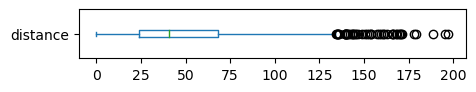

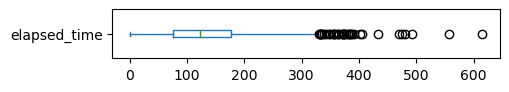

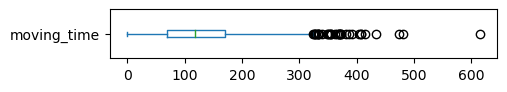

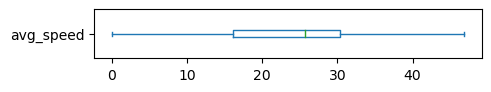

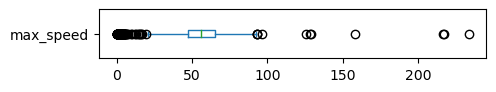

...

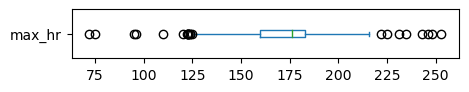

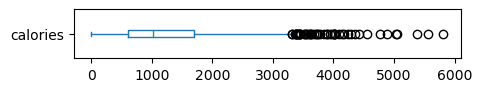

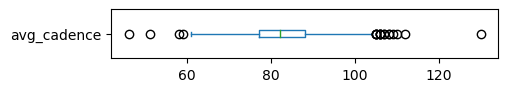

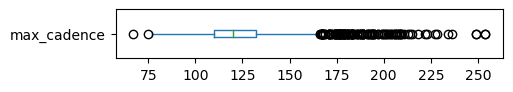

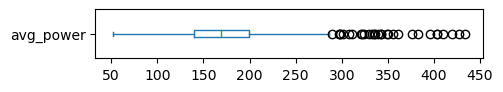

In [12]:
exclude_col = ["activity_id","category_id","athlete_id","filename","timestamp"]
outliers_column = []
count=0
for col in data.columns:
   if col not in exclude_col:
          outliers_column.append(col)
          plt.figure(figsize = (5,10), dpi=100)
          count+=1
          plt.subplot(len(data.columns)-len(exclude_col),1,count)
          data[col].plot(kind='box', vert=False)
plt.show()

### Analysis 4:
The attributes consists of outlier data instances.

## 1. Are all data instances useful Justify. If not, data are useful, which instances should be removed and why?
### Answer: 
All the 1937 data instances of the training.csv files are not useful. The objective of this project is to develop a predictive model for athlete's performance and therefore in our opinion we need to remove the following instances:
* Based on our analysis 1, analysis 2 and analysis 3 it is clear that that the distribution of the attributes varies with respect to individual athlete and the category of the activity performed. We therefore think that we should only retain the 314 data instances of the author (athlete_id: 5) for further personalized performance analysis and ignore the 1623 data instances with athlete_id: 1,2,3,4,6. Our reason behind removing these 1623 data instances is that all of these instances only reflects the uncategorized activity (category_id: 0) which in turn can make the predictive model biased toward category_id: 0. Furthermore from the figures of of analysis 1 and analysis 2 we can see that the attribute distribution is also quite dissimilar to the attribute distributions of data instances that belong to the author (athlete_id:5). Next in analysis 3, we can see distinctive clusters in the scatter plots of the 314 data instances of athlete_ID:5, whereas the rest of the 1623 data instances that belongs to activity category_ID:0 are spreaded widely across the plots. 
* Now from the 314 data instances of athlete_ID:5 that we tends to retain for further analysis, removing outliers of all the attributes according to analysis 4 would further reduce the number of data instances. Considering this, we are only going to removes the outlier intances for three attributes i.e "avg_hr", "calories", and "avg_power" 

In [13]:
def clean_data(df, col, id):
  data = df[(df[col]==id)]
  return data

def remove_outliers(df,columns):
    for col in columns:
        print('Removing outliers of attribute: {}'.format(col))
        # mean = df[col].mean()
        # sd = df[col].std()
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        Lower_Fence = Q1 - (1.5 * IQR)
        Upper_Fence = Q3 + (1.5 * IQR)
        df = df[(df[col]<Upper_Fence)]
        df = df[(df[col]>Lower_Fence)]
    return df

No of data instances retained from athlete_id(5): 314
Removing outliers of attribute: avg_power
Removing outliers of attribute: avg_hr
Removing outliers of attribute: calories
No of data instances finally retained from athlete_id(5) for analysis: 281


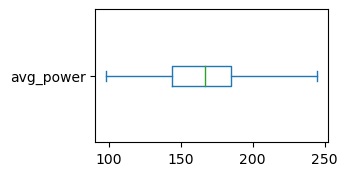

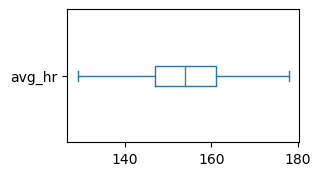

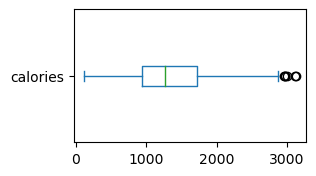

In [14]:
data_cleaned = clean_data(data, col="athlete_id", id=5)
print("No of data instances retained from athlete_id(5):", data_cleaned.shape[0])
# print(outliers_column)        
columns_temp = ["avg_power", "avg_hr", "calories"]
# data_cleaned2 = remove_outliers(data_cleaned, outliers_column)
data_cleaned2 = remove_outliers(data_cleaned, columns_temp)
print("No of data instances finally retained from athlete_id(5) for analysis:", data_cleaned2.shape[0])
count = 1
for col in columns_temp:
   plt.figure(figsize = (3,6), dpi=100)
   plt.subplot(len(columns_temp),1,count)
   data_cleaned2[col].plot(kind='box', vert=False)
   count+=1

## 2. Are all features useful? If not, which features should be removed and why?
### Answer: 
In our opinion the "filename" attribute and the "timestamp" attribute should be removed because they do not bear any statistical significance and therefore do not provide any useful information about the data.  

In [15]:
data_cleaned = data_cleaned2.drop(columns="filename")
data_cleaned = data_cleaned.drop(columns="timestamp")
data_cleaned.head()

,activity_id,category_id,athlete_id,distance,elapsed_time,moving_time,avg_speed,max_speed,elevation_gain,elevation_loss,avg_hr,max_hr,calories,avg_cadence,max_cadence,avg_power
ID,,,,,,,,,,,,,,,,
1623,1624,1,5,50.01,88.02,88.04,34.17,61.25,1,2,174,196,1527,89,115,198
1624,1625,1,5,30.02,63.27,63.27,28.53,38.98,0,0,165,189,1014,87,112,127
1625,1626,1,5,30.57,59.98,60.00,30.66,42.48,11,10,175,193,1049,95,124,140
1626,1627,1,5,30.24,60.00,60.02,30.30,41.66,0,0,176,192,1067,89,102,143
1627,1628,1,5,30.22,60.00,60.02,30.28,37.28,0,0,176,191,1060,88,103,136


## Evaluating Patterns / Correlations

In [16]:
display(data_cleaned.corr())

,activity_id,category_id,athlete_id,distance,elapsed_time,moving_time,avg_speed,max_speed,elevation_gain,elevation_loss,avg_hr,max_hr,calories,avg_cadence,max_cadence,avg_power
activity_id,1.000000,0.744807,NaN,-0.056571,-0.130659,0.192290,0.175859,0.286720,0.057812,0.040665,-0.084729,-0.165189,0.172812,0.348332,0.056184,0.554047
category_id,0.744807,1.000000,NaN,-0.175869,-0.277905,-0.185757,0.313477,0.385257,-0.126069,-0.146548,0.086211,-0.002078,-0.173016,0.201032,-0.102002,0.494649
athlete_id,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
distance,-0.056571,-0.175869,NaN,1.000000,0.858428,0.699080,0.059043,0.148726,0.669411,0.697033,-0.034001,0.141670,0.712206,0.060774,0.133523,-0.019820
elapsed_time,-0.130659,-0.277905,NaN,0.858428,1.000000,0.699578,-0.380593,0.118996,0.816944,0.833230,-0.281799,0.099491,0.654207,-0.326996,0.146269,-0.264181
moving_time,0.192290,-0.185757,NaN,0.699080,0.699578,1.000000,-0.228500,0.135174,0.757139,0.733647,-0.184190,-0.015729,0.976893,0.044057,0.198023,-0.016793
avg_speed,0.175859,0.313477,NaN,0.059043,-0.380593,-0.228500,1.000000,-0.010587,-0.498862,-0.460859,0.529617,0.057808,-0.122339,0.761822,-0.075945,0.564845
max_speed,0.286720,0.385257,NaN,0.148726,0.118996,0.135174,-0.010587,1.000000,0.308595,0.308639,-0.054300,0.041060,0.126380,-0.037554,0.044460,0.133195
elevation_gain,0.057812,-0.126069,NaN,0.669411,0.816944,0.757139,-0.498862,0.308595,1.000000,0.979683,-0.274443,0.079441,0.716885,-0.335485,0.156457,-0.128126
elevation_loss,0.040665,-0.146548,NaN,0.697033,0.833230,0.733647,-0.460859,0.308639,0.979683,1.000000,-0.278984,0.069122,0.692809,-0.337722,0.162914,-0.160061


In [17]:
import matplotlib.pyplot as plt
r = len(data_cleaned.columns)
c = len(data_cleaned.columns)
fig, axes = plt.subplots(r, c, figsize=(60,60), dpi=300)
index = 0
for i in range(r):
    for j in range(c):
        ax1 = int(index/r)
        ax2 = index % c
        if not i==j:
          axes[ax1][ax2].scatter(data_cleaned[data_cleaned.columns[i]], data_cleaned[data_cleaned.columns[j]], color='dodgerblue')
          axes[ax1][ax2].set_xlabel(data_cleaned.columns[i])
          axes[ax1][ax2].set_ylabel(data_cleaned.columns[j])
          axes[ax1][ax2].xaxis.set_ticklabels([])
          axes[ax1][ax2].yaxis.set_ticklabels([])
        index = index + 1
fig.suptitle('Scatter plot showing correlation between variables', ha='center', fontsize=48)
plt.show()

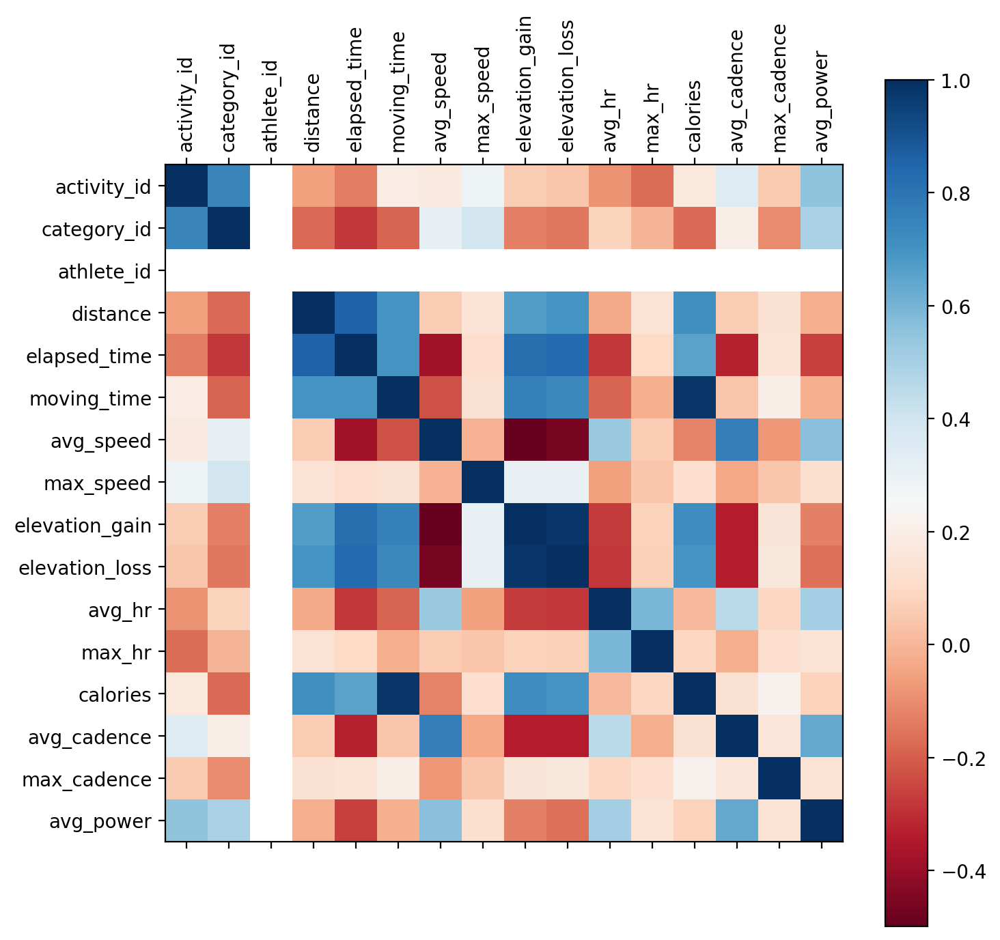

In [18]:
corr = data_cleaned.corr()
fig = plt.figure(figsize=(8,8), dpi=200)
heat = plt.matshow(corr, cmap='RdBu', fignum=fig.number)
plt.colorbar(heat)
plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical')
plt.yticks(range(len(corr.columns)), corr.columns)

plt.show()

### Visualizing a baseline regression model

avg_power: y = 4.54 + 1.05 x avg_speed + 1.60 x avg_cadence


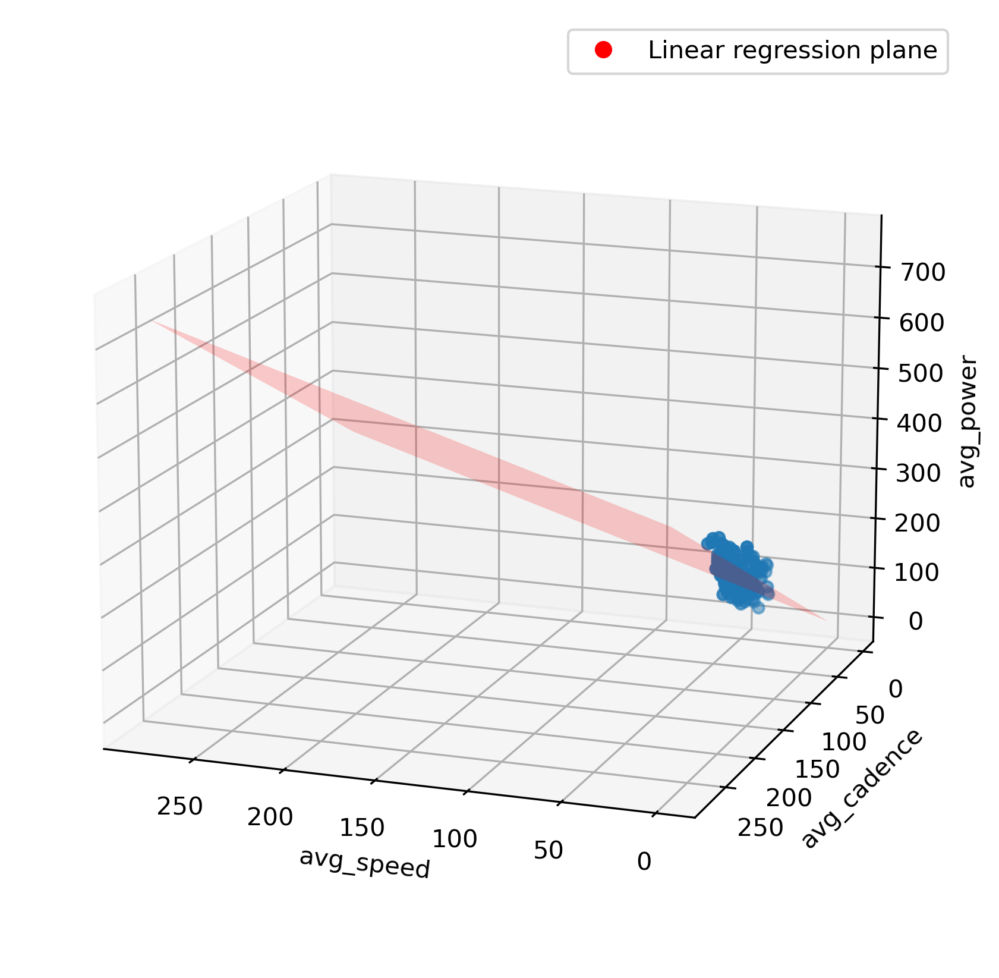

In [19]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import sklearn.linear_model

fig = plt.figure(figsize = (10, 7), dpi=300)
ax = plt.axes(projection ="3d")

x = data_cleaned['avg_speed']
y = data_cleaned['avg_cadence']
z = data_cleaned['avg_power']

ax.scatter3D(x, y, z, marker='o')
ax.set_xlabel('avg_speed')
ax.set_ylabel('avg_cadence')
ax.set_zlabel('avg_power')

X_train = data_cleaned[['avg_speed', 'avg_cadence']]
Y_train = data_cleaned['avg_power']

model = sklearn.linear_model.LinearRegression()
model.fit(X_train, Y_train)
y_pred = model.predict(X_train)

coefs = model.coef_
intercept = model.intercept_
xs = np.tile(np.arange(len(x)), (len(x),1))
ys = np.tile(np.arange(len(y)), (len(y),1)).T
zs = xs*coefs[0]+ys*coefs[1]+intercept
print("avg_power: y = {:.2f} + {:.2f} x avg_speed + {:.2f} x avg_cadence".format(intercept, coefs[0],
                                                          coefs[1]))
reg = ax.plot_surface(xs,ys,zs, color="red", alpha=0.2)

fake2Dline = mpl.lines.Line2D([0],[0], linestyle="none", c='r', marker = 'o')
ax.legend([fake2Dline], ['Linear regression plane'], numpoints = 1)

# ax.legend()
ax.view_init(15, 110)

plt.show()

### Analysis 5:
We can see the correlation between avg_power, avg_speed and avg_cadence. Such correlation can be used to evaluate the linear combination of the attributes to derieve a regression plane as shown above to approximate avg_power.

## 3. What patterns/leads can you see in the dataset?
### Answer:
* By analyzing the correlation plots above we can see that there exists both positive and negative correlations between attributes. For example we can see that avg_power is positively correlated with the attributes- avg_speed, avg_hr, avg_cadence. Meanwhile it is negatively correlated to the attributes- elapsed_time, elevation loss.

# (C) Proposal of a training app based on predictive model

## 4. Based on the available data, propose a predictive task for the startup company to pursue. Explain how it will fit with their overall objective of developing a personalized training app.
### Answer:
The data instances of the author (athlete_id:5) exhibits significant correlation among its attributes. Based on this we propose the followings on the development of personalized training app:
* We can use either the power measurement or the heart rate to  evaluate the progress of athlete's performance. However, we think it is better to use power measurement instead of heart rate for such evaluation as heart rate can be influenced by factor such as temperature, anxiety, hydration level etc. 
* As a proof of concept, we analyze a baseline regression model in analysis 5 which clearly shows that prediction of avg_power is possible with the available data.
* Based on the preliminary analysis of the data, instead of developing a generalized predictive model for athlete of any tier performing any activities, we propose to develop an individual/personalized data specific predictive model.
* A predictive model trained on the individual data can perfectly fit with the overall objective of developing a personalized training app, because if the model can predict an athlete's performance in terms of power measurement (avg_power) quite accurately, then such prediction can be used to formulate personalized workout routine that the training app can recommend to the individual athlete. In this regards, the mobile app will continuously collect athlete's data through mobile sensors and connected accessories such as smart watch. These data will be sent to a central server which will asynchornously evaluate a personalized predictive model. We proposed to incrementally enhance the predictive model by ensembling the previously trained predictive models over different timesteps. 

## 5. What are some limitations and/or concerns of your proposal?
### Answer:
Our proposal has the following limitations:
* Developing personalized predictive model by collecting individual data would require to handle a substantial amount of data. This would  lead to high data storage cost, network infrastructure cost as well as cost associated to computations. 
* We are hypothesizing the baseline predictive model by only analyzing the patterns demonstrated by one individual data source (athlete_id:5). Personalized data of another athlete from a different tier may not be useful for training a predictive model at all.

## 6. What other data could be collected by the company to improve the app?
### Answer:
The company could collect the following data to improve the app:
* In order to verify the baseline assumption about developing personalized predictive model, the company needs to collect moderately balanced individual data from every athlete tier as well as the category of performed activity. 
* Using these newly collected data, the company can analyze whether generalized models can be developed for the tier of the athlete or the activity performed. Doing so will allow the company to reduce its cost associated in data collection and analysis as well as improve prediction accuracy over unseen datapoints.
* Since the prediction model is greatly dependent on the quality of data, the company can collect new attributes such as - body temperature, GPS accuracy, weather humidity etc. These data can help accurately measure distance, moving time, speed and analyze any abnormality in heart rate.

# (D) Collecting data for test1.csv and test2.csv

In [20]:
!pip install fitparse

In [21]:
from parser import *
from utils import *

In [22]:
data_dir = '../data/new_activities/'
test1_filename = '../output/test1.csv'
parse_data(data_dir, test1_filename, athlete_id=5)

File saved!!! ../output/test1.csv


In [23]:
data_test1 = pd.read_csv(test1_filename)

In [24]:
data_test1.set_index('ID', inplace=True)
data_test1.shape

(25, 18)

In [25]:
check_datasets(test1_filename, file_count=1)

Missing values in ../output/test1.csv
No duplicated row found


In [26]:
data_test1.describe()

,activity_id,category_id,athlete_id,distance,elapsed_time,moving_time,avg_speed,max_speed,elevation_gain,elevation_loss,avg_hr,max_hr,calories,avg_cadence,max_cadence,avg_power
count,25.000000,0.0,25.0,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000
mean,13.000000,NaN,5.0,32.386131,64.794000,63.950000,31.450618,66.111696,452.872000,417.320000,154.570398,179.360000,1390.257435,86.152686,111.120000,193.376930
std,7.359801,NaN,0.0,21.848566,45.414774,44.438061,7.075911,11.965738,396.116321,384.364861,32.301393,19.903685,289.923974,7.788302,15.014771,46.929477
min,1.000000,NaN,5.0,2.111070,4.616667,4.383333,17.610477,46.958400,4.200000,15.400000,25.278481,121.000000,233.497340,68.249453,79.000000,95.350211
25%,7.000000,NaN,5.0,18.042480,30.166667,30.166667,28.528827,59.619600,189.200000,161.000000,145.970478,167.000000,1311.810297,82.225707,99.000000,162.605289
50%,13.000000,NaN,5.0,26.371780,60.066667,59.666667,30.613338,63.385200,309.400000,296.600000,154.796271,185.000000,1391.660100,85.838923,114.000000,185.666401
75%,19.000000,NaN,5.0,42.369090,88.416667,86.233333,35.679458,74.142000,561.200000,522.800000,177.796432,197.000000,1599.749983,92.475054,120.000000,238.347618
max,25.000000,NaN,5.0,101.847450,215.616667,212.883333,44.386246,99.518400,1625.800000,1618.400000,189.683901,202.000000,1707.299754,97.352673,145.000000,264.069672


In [27]:
data_dir = '../data/newer_activities/'
test2_filename = '../output/test2.csv'
parse_data(data_dir, test2_filename, athlete_id=5)

File saved!!! ../output/test2.csv


In [28]:
data_test2 = pd.read_csv(test2_filename)

In [29]:
data_test2.set_index('ID', inplace=True)
data_test2.shape

(26, 18)

In [30]:
check_datasets(test2_filename, file_count=1)

Missing values in ../output/test2.csv
No duplicated row found


In [31]:
data_test2.describe()

,activity_id,category_id,athlete_id,distance,elapsed_time,moving_time,avg_speed,max_speed,elevation_gain,elevation_loss,avg_hr,max_hr,calories,avg_cadence,max_cadence,avg_power
count,26.000000,0.0,26.0,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,13.500000,NaN,5.0,43.313309,90.319231,89.619872,28.728092,53.950292,496.830769,495.792308,152.856569,180.384615,1374.110982,88.501518,114.730769,162.406583
std,7.648529,NaN,0.0,24.964697,48.237289,48.335194,4.899137,7.016537,312.312770,311.413759,13.891672,10.143281,125.682444,9.019920,6.937191,44.247215
min,1.000000,NaN,5.0,2.899320,8.633333,8.633333,14.101738,33.897600,39.000000,40.800000,114.360953,154.000000,1025.828707,57.448883,99.000000,52.284900
25%,7.250000,NaN,5.0,31.472397,65.941667,64.729167,28.430032,51.098400,357.550000,361.150000,143.868628,175.250000,1292.794182,88.232777,113.250000,144.230608
50%,13.500000,NaN,5.0,40.727605,81.325000,80.133333,30.021505,54.185400,443.800000,435.800000,153.804882,183.500000,1382.690680,92.192806,116.000000,172.102987
75%,19.750000,NaN,5.0,44.507388,94.870833,94.395833,30.865713,57.036600,491.300000,494.400000,162.366584,186.000000,1460.151166,92.869670,117.000000,193.117868
max,26.000000,NaN,5.0,105.119630,210.716667,210.200000,39.588151,65.556000,1416.000000,1404.200000,178.121957,195.000000,1602.695119,98.536914,130.000000,235.308224


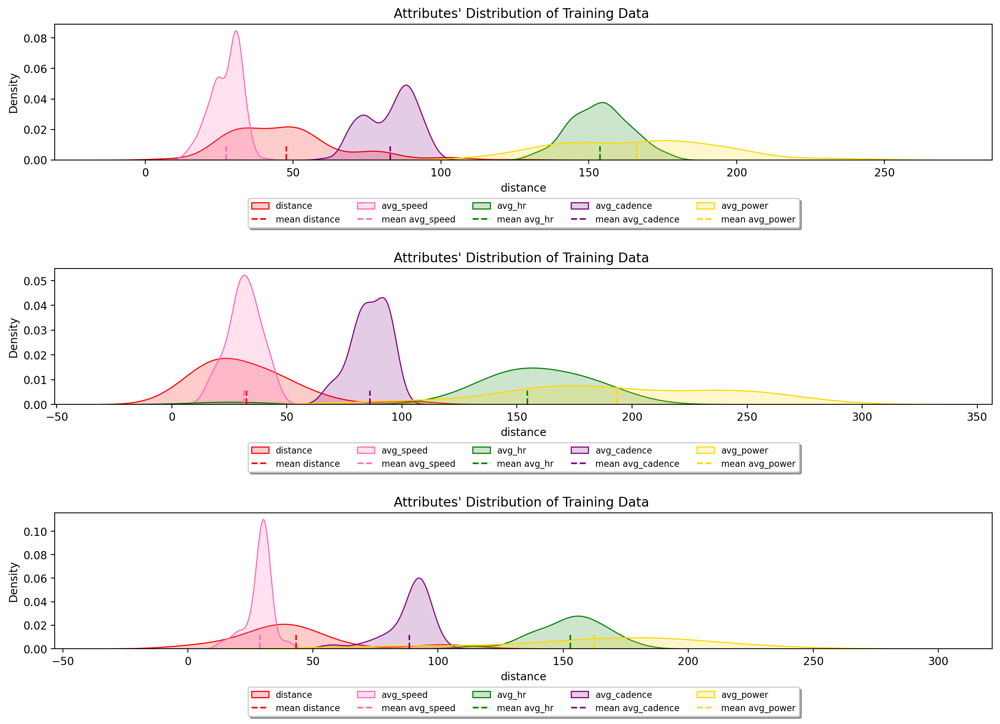

In [32]:
plt.figure(figsize = (15, 10), dpi=200)
#------------------------------------------------------
plt.subplot(3,1,1)
ax=sns.kdeplot(data_cleaned['distance'], color='red', fill=True, alpha=.2, linewidth=1, label="distance")
ax.axvline(data_cleaned['distance'].mean(), color='red', linestyle="--", ymax=0.10, label="mean distance")

ax = sns.kdeplot(data_cleaned['avg_speed'], color='hotpink', fill=True, alpha=.2, linewidth=1, label="avg_speed")
ax.axvline(data_cleaned['avg_speed'].mean(), color='hotpink', linestyle="--", ymax=0.10, label="mean avg_speed")

ax = sns.kdeplot(data_cleaned['avg_hr'], color='green', fill=True, alpha=.2, linewidth=1, label="avg_hr")
ax.axvline(data_cleaned['avg_hr'].mean(), color='green', linestyle="--", ymax=0.10, label="mean avg_hr")

ax = sns.kdeplot(data_cleaned['avg_cadence'], color='purple', fill=True, alpha=.2, linewidth=1, label="avg_cadence")
ax.axvline(data_cleaned['avg_cadence'].mean(), color='purple', linestyle="--", ymax=0.10, label="mean avg_cadence")

ax = sns.kdeplot(data_cleaned['avg_power'], color='gold', fill=True, alpha=.2, linewidth=1, label="avg_power")
ax.axvline(data_cleaned['avg_power'].mean(), color='gold', linestyle="--", ymax=0.10, label="mean avg_power")
plt.title("Attributes' Distribution of Training Data ")
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), fontsize=8, fancybox=True, shadow=True, ncol=5)

#------------------------------------------------------
plt.subplot(3,1,2)
ax=sns.kdeplot(data_test1['distance'], color='red', fill=True, alpha=.2, linewidth=1, label="distance")
ax.axvline(data_test1['distance'].mean(), color='red', linestyle="--", ymax=0.10, label="mean distance")

ax = sns.kdeplot(data_test1['avg_speed'], color='hotpink', fill=True, alpha=.2, linewidth=1, label="avg_speed")
ax.axvline(data_test1['avg_speed'].mean(), color='hotpink', linestyle="--", ymax=0.10, label="mean avg_speed")

ax = sns.kdeplot(data_test1['avg_hr'], color='green', fill=True, alpha=.2, linewidth=1, label="avg_hr")
ax.axvline(data_test1['avg_hr'].mean(), color='green', linestyle="--", ymax=0.10, label="mean avg_hr")

ax = sns.kdeplot(data_test1['avg_cadence'], color='purple', fill=True, alpha=.2, linewidth=1, label="avg_cadence")
ax.axvline(data_test1['avg_cadence'].mean(), color='purple', linestyle="--", ymax=0.10, label="mean avg_cadence")

ax = sns.kdeplot(data_test1['avg_power'], color='gold', fill=True, alpha=.2, linewidth=1, label="avg_power")
ax.axvline(data_test1['avg_power'].mean(), color='gold', linestyle="--", ymax=0.10, label="mean avg_power")
plt.title("Attributes' Distribution of Training Data ")
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), fontsize=8, fancybox=True, shadow=True, ncol=5)

#------------------------------------------------------
plt.subplot(3,1,3)
ax=sns.kdeplot(data_test2['distance'], color='red', fill=True, alpha=.2, linewidth=1, label="distance")
ax.axvline(data_test2['distance'].mean(), color='red', linestyle="--", ymax=0.10, label="mean distance")

ax = sns.kdeplot(data_test2['avg_speed'], color='hotpink', fill=True, alpha=.2, linewidth=1, label="avg_speed")
ax.axvline(data_test2['avg_speed'].mean(), color='hotpink', linestyle="--", ymax=0.10, label="mean avg_speed")

ax = sns.kdeplot(data_test2['avg_hr'], color='green', fill=True, alpha=.2, linewidth=1, label="avg_hr")
ax.axvline(data_test2['avg_hr'].mean(), color='green', linestyle="--", ymax=0.10, label="mean avg_hr")

ax = sns.kdeplot(data_test2['avg_cadence'], color='purple', fill=True, alpha=.2, linewidth=1, label="avg_cadence")
ax.axvline(data_test2['avg_cadence'].mean(), color='purple', linestyle="--", ymax=0.10, label="mean avg_cadence")

ax = sns.kdeplot(data_test2['avg_power'], color='gold', fill=True, alpha=.2, linewidth=1, label="avg_power")
ax.axvline(data_test2['avg_power'].mean(), color='gold', linestyle="--", ymax=0.10, label="mean avg_power")
plt.title("Attributes' Distribution of Training Data ")
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), fontsize=8, fancybox=True, shadow=True, ncol=5)
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.8)
plt.show()

## Analysis 6:
The attribute's distribution of data instances from test1.csv and test2.csv is quite similar to the attribute's distribution of data instances from cleaned training data.

# (E) Power Prediction
In this project we implement two following regression model to predict the avg_power of the athletes:
* Linear regression
* Dicision tree regression

In [33]:
from regression import *

In [34]:
train_data = data_cleaned
print(train_data.shape)

(281, 16)


# (E.1)  Training regression model on cleaned data (Only consisting the data instances of athlete_id:5)

## Testing regression model on test1.csv

#################
Linear Regression
#################
Training Performance
-----------------
MSE: 303.8894181496821
R2 Score: 0.6059521866458686
-----------------


Testing Performance
-----------------
MSE: 500.3678496014413
R2 Score: 0.7633389815597308
-----------------


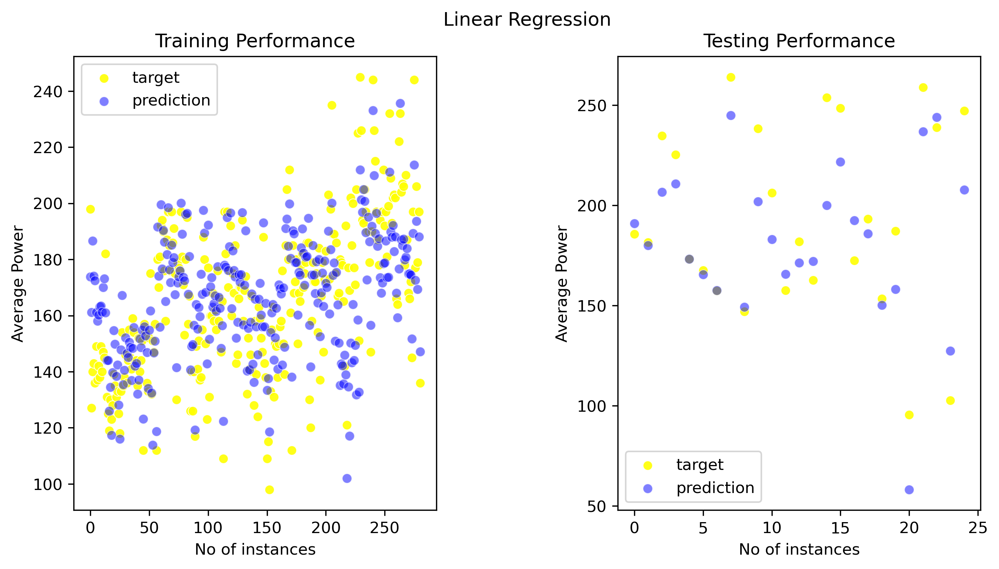

########################
Decision Tree Regression
########################
Training Performance
------------------------
MSE: 145.13035229538244
R2 Score: 0.811812144294074
------------------------


Testing Performance
------------------------
MSE: 1051.2598392692014
R2 Score: 0.502781354947218
------------------------


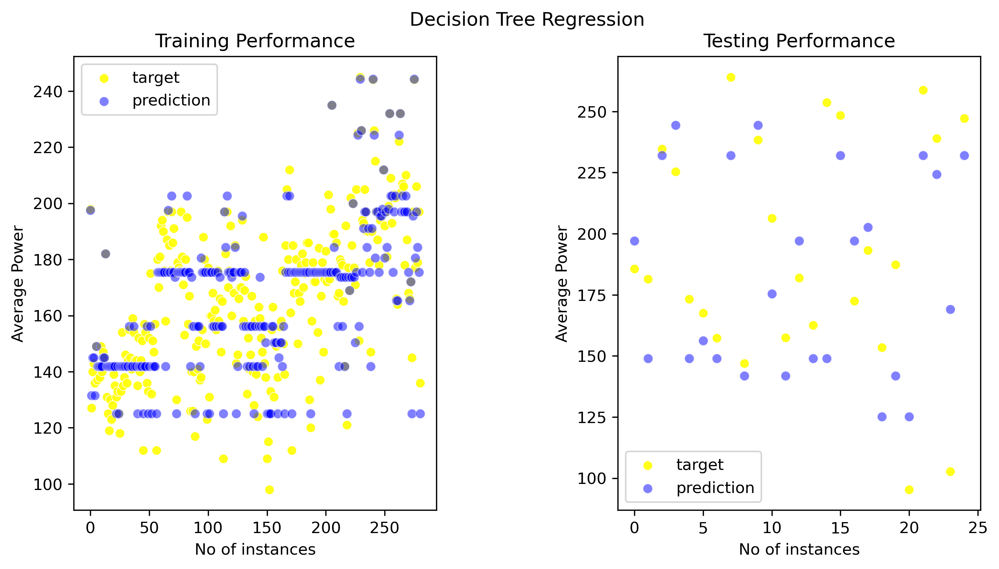

In [35]:
X_train,Y_train,X_test,Y_test = split_data(train_data, data_test1)
trained_linear_reg_model, trained_dt_reg_model = run_regression_comparison(X_train,Y_train,X_test,Y_test)


## Testing regression model on test2.csv

#################
Linear Regression
#################
Training Performance
-----------------
MSE: 303.8894181496821
R2 Score: 0.6059521866458686
-----------------


Testing Performance
-----------------
MSE: 301.90757977582155
R2 Score: 0.8396254419025274
-----------------


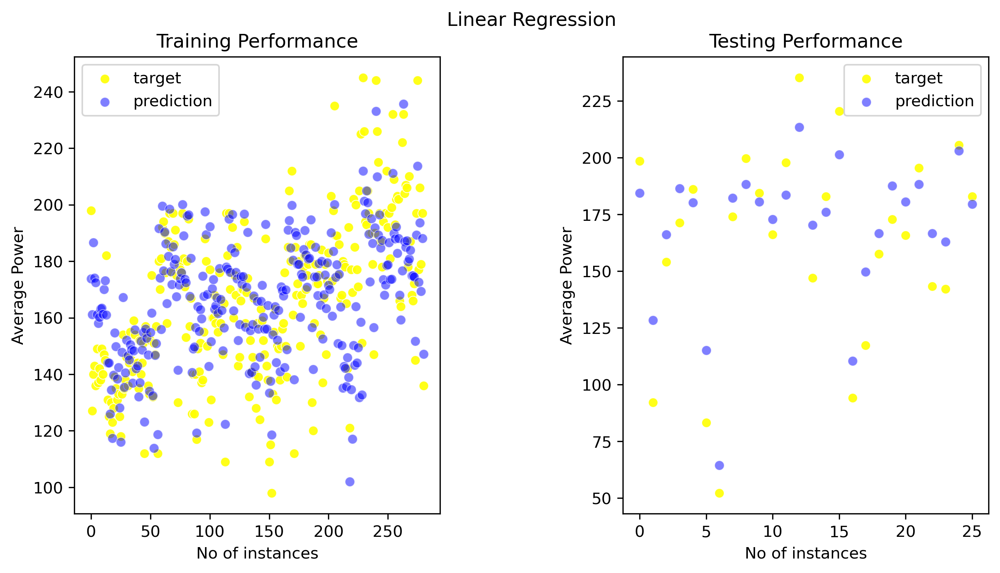

########################
Decision Tree Regression
########################
Training Performance
------------------------
MSE: 145.13035229538244
R2 Score: 0.811812144294074
------------------------


Testing Performance
------------------------
MSE: 1038.8693953491781
R2 Score: 0.4481482699976389
------------------------


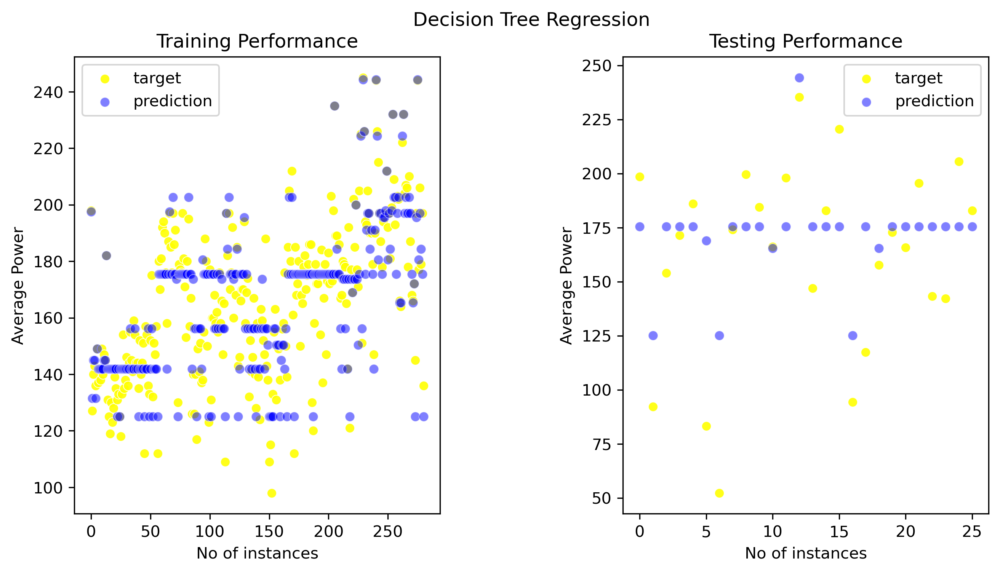

In [36]:
X_train,Y_train,X_test,Y_test = split_data(train_data, data_test2)
trained_linear_reg_model, trained_dt_reg_model = run_regression_comparison(X_train,Y_train,X_test,Y_test)

# (E.2) Training regression model on all data instance of training.csv

In [37]:
file_path = '../data/training.csv'
train_data2 = pd.read_csv(file_path)
print(train_data2.shape)

(1937, 18)


## Testing regression model on test1.csv

#################
Linear Regression
#################
Training Performance
-----------------
MSE: 957.2663743483628
R2 Score: 0.5224343859738434
-----------------


Testing Performance
-----------------
MSE: 1723.5865594433503
R2 Score: 0.18478824957931927
-----------------


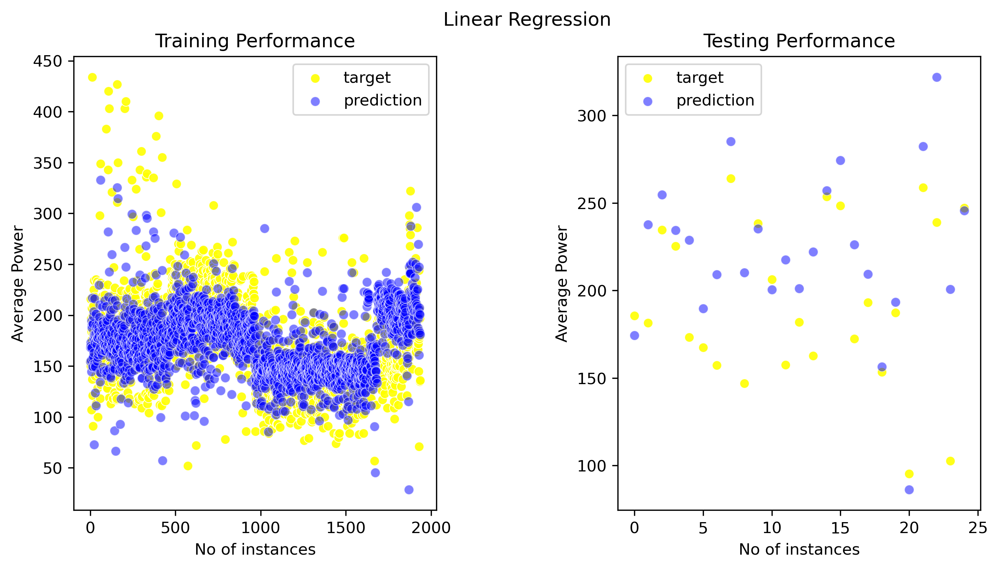

########################
Decision Tree Regression
########################
Training Performance
------------------------
MSE: 621.3447019943256
R2 Score: 0.690020591884037
------------------------


Testing Performance
------------------------
MSE: 6036.969564145327
R2 Score: -1.8553300666330936
------------------------


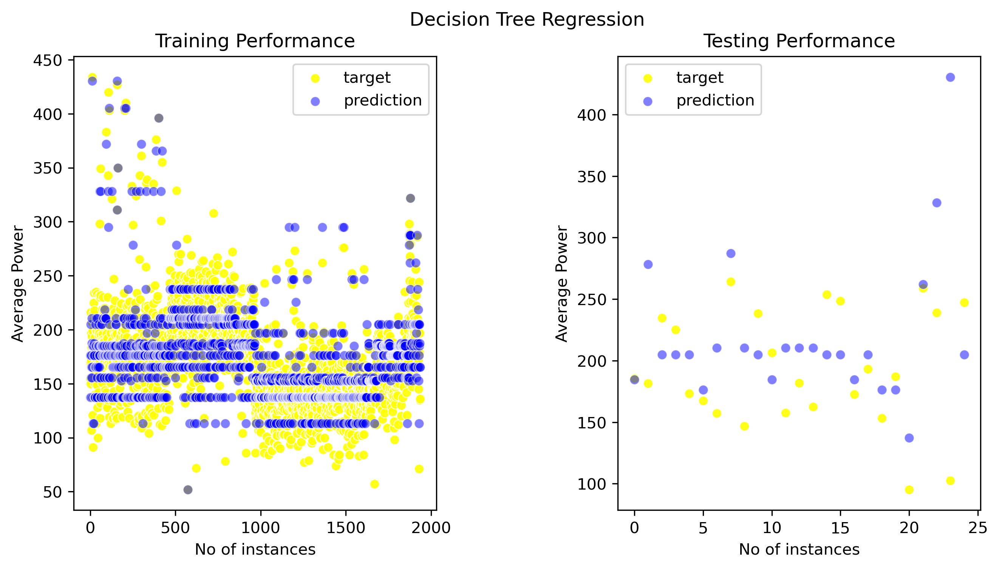

In [38]:
X_train,Y_train,X_test,Y_test = split_data(train_data2, data_test1)
trained_linear_reg_model, trained_dt_reg_model = run_regression_comparison(X_train,Y_train,X_test,Y_test)

## Testing regression model on test2.csv

#################
Linear Regression
#################
Training Performance
-----------------
MSE: 957.2663743483628
R2 Score: 0.5224343859738434
-----------------


Testing Performance
-----------------
MSE: 2599.7960535904194
R2 Score: -0.38102244252268225
-----------------


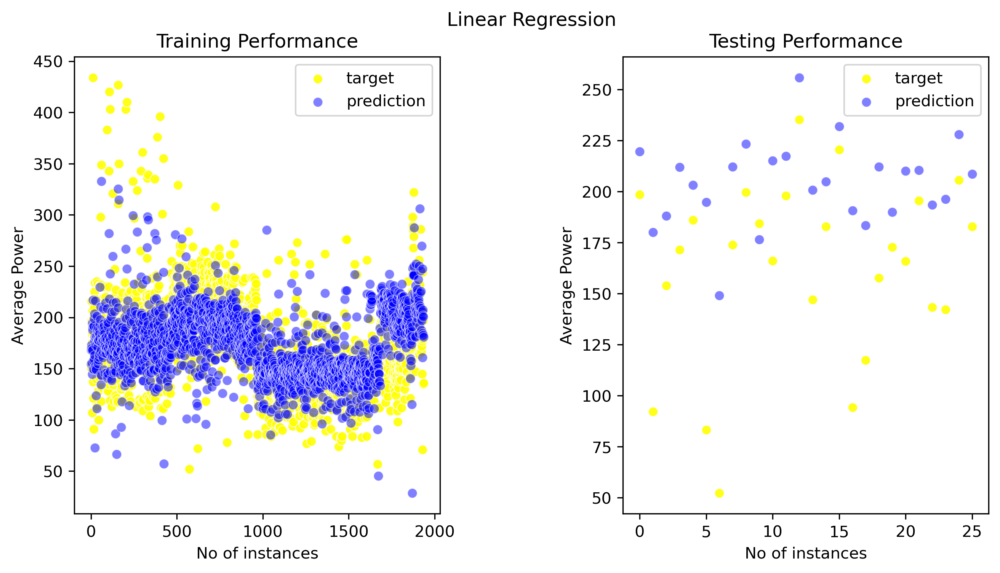

########################
Decision Tree Regression
########################
Training Performance
------------------------
MSE: 621.3447019943256
R2 Score: 0.690020591884037
------------------------


Testing Performance
------------------------
MSE: 1391.408152016789
R2 Score: 0.2608782208164211
------------------------


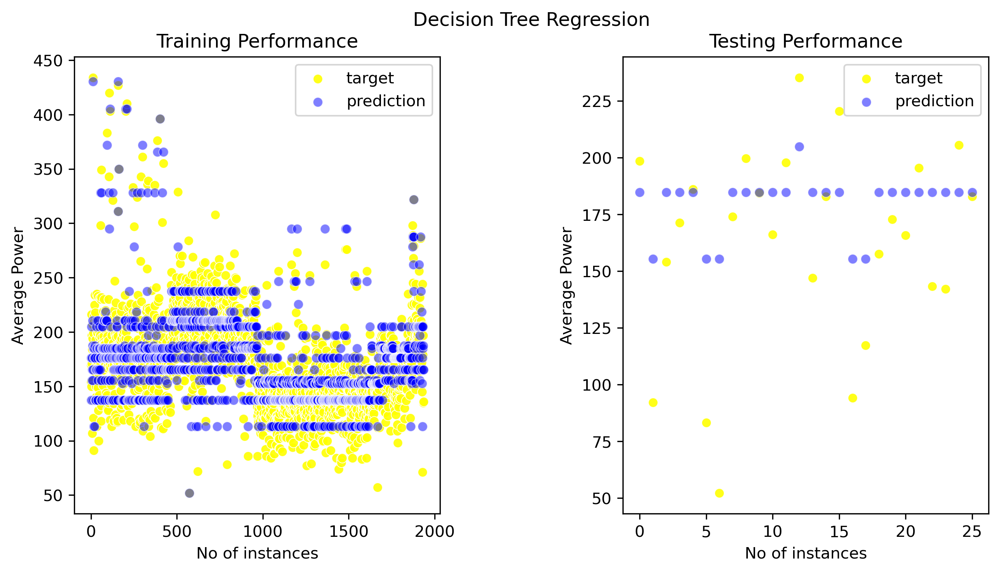

In [39]:
X_train,Y_train,X_test,Y_test = split_data(train_data2, data_test2)
trained_linear_reg_model, trained_dt_reg_model = run_regression_comparison(X_train,Y_train,X_test,Y_test)